# Imports

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import math, itertools, traceback
from ncempy.io import dm

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize
from matplotlib import cm
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

from mpl_toolkits import mplot3d
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.interpolate import UnivariateSpline

from pynistview_utils import *
from selelems import *
# import pynistview_utils as pyn
# import selelems as sel

import cv2

# plt.style.use('dark_background')


# Set up directories and files

In [108]:
# Configure input files

indir = "/Users/rmoraski/Documents/iCloud/School/Electrons/NISTView-ish/data"
sempa_file_suffix = 'sempa'

#name = "191001_Fe_whisker/Fe_whisker"

# name = "FeGd_Nov_Dec/171117_FeGd"
# runs = (2, 3)

# name = "FeGd_Nov_Dec/FeGd100"
# runs = (6, 7)
# runs = (11, 10)

# name = "FeGd_Nov_Dec/FeGd200"
# runs = (3, 2) # bad
# runs = (5, 6) # also bad

# name = 'alice/171117_FeGd'
# runs = (2, 3)

name = "FeGd_5x120/20161213"
# runs = (5, 6)
runs = (8, 9)
# runs = (12, 13)

# Specify the number of features - 1 in the image. This is used to segment and create masks.
segments = 2

# Specify gaussian denoising sigma
sigma = 2

# Specify non-local denoising strength h. Larger h -> more denoising.
h = 20

# Specify a scale for drawing the vector arrows. Smaller number -> longer arrow.
arrow_scale = 0.2

# Specify a color for the vector arrows.
# arrow_color = 'black'
arrow_color = 'white'


# Import files

In [109]:
image_dict = import_files(name, runs, indir)

intensity_1, intensity_1_blurred, intensity_1_flat = image_dict['i1']
intensity_2, intensity_2_blurred, intensity_2_flat = image_dict['i2']

m_1, axis_1, m_1_ydim, m_1_xdim, m_1_min, m_1_max = image_dict['m1']
m_2, axis_2, m_2_ydim, m_2_xdim, m_2_min, m_2_max = image_dict['m2']
m_3, axis_3, m_3_ydim, m_3_xdim, m_3_min, m_3_max = image_dict['m3']
m_4, axis_4, m_4_ydim, m_4_xdim, m_4_min, m_4_max = image_dict['m4']

scale = image_dict['scale']
magnification = image_dict['magnification']

Searching FeGd_5x120/20161213* for runs (8, 9)...
Found files:
['20161213008_ix2.sempa', '20161213008_iz.sempa', '20161213008_mx2.sempa', '20161213008_mz.sempa', '20161213009_ix.sempa', '20161213009_iy.sempa', '20161213009_mx.sempa', '20161213009_my.sempa']


FeGd_5x120/20161213 (8, 9)
Scale: 13.57 nm per pixel, Magnification: 40000x


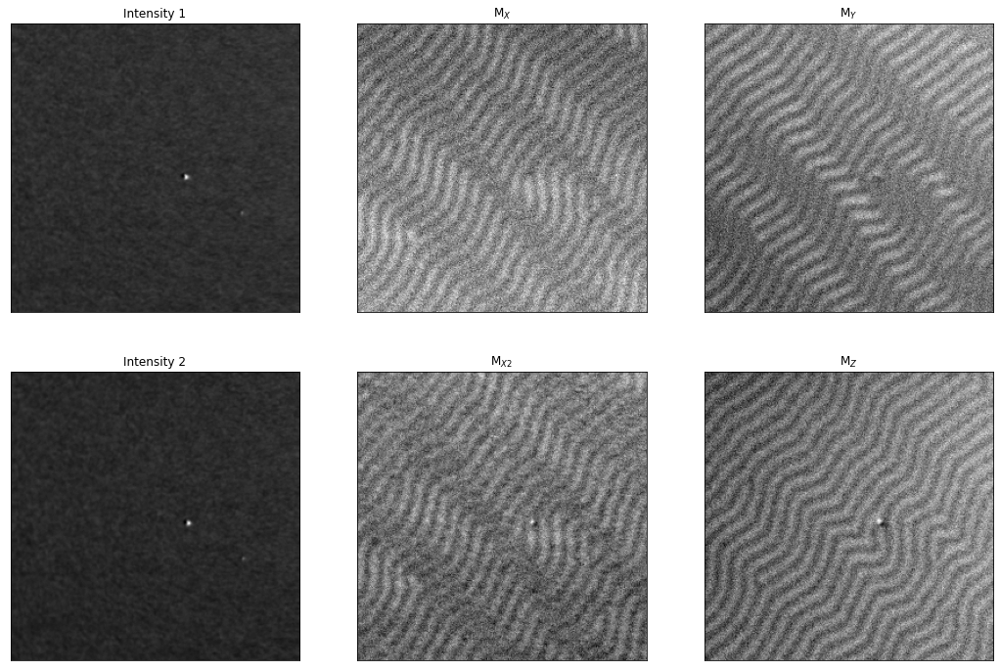

In [110]:
fig = plt.figure(figsize=(18, 12));
plt.subplot(231);
plt.imshow(intensity_1, cmap='gray');
plt.title('Intensity 1');
plt.subplot(232);
plt.imshow(m_1, cmap='gray');
plt.title(fr'M$_{axis_1}$');
plt.subplot(233);
plt.imshow(m_2, cmap='gray');
plt.title(f'M$_{axis_2}$');
plt.subplot(234);
plt.imshow(intensity_2, cmap='gray');
plt.title('Intensity 2');
plt.subplot(235);
plt.imshow(m_4, cmap='gray');
plt.title(f'M$_{axis_4}$$_2$');
plt.subplot(236);
plt.imshow(m_3, cmap='gray');
plt.title(f'M$_{axis_3}$');

for ax in fig.get_axes():
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

print(name, runs)
print(f'Scale: {scale * 10e8:.2f} nm per pixel, Magnification: {int(magnification)}x')

In [130]:
mgs = cv2.reg  MapperGradShift.calculate(intensity_1, intensity_2)

AttributeError: module 'cv2.reg' has no attribute 'MapperGradShift'

-0.009601443


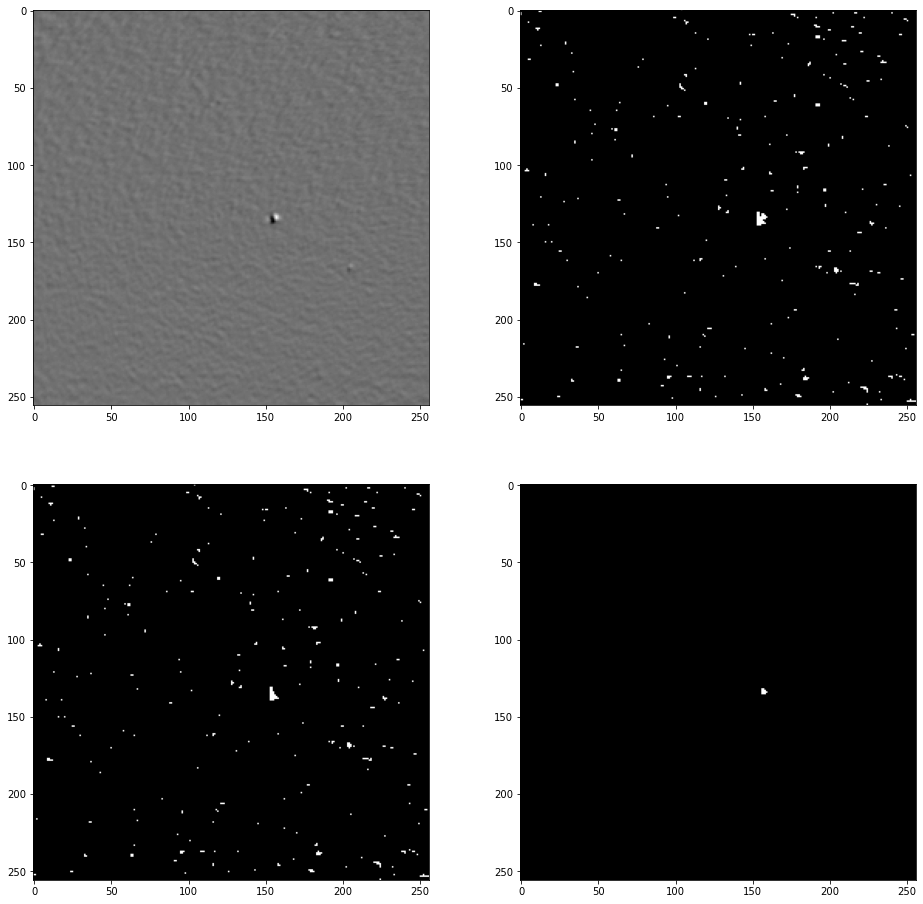

In [128]:
im_diff = rescale_to(intensity_2, intensity_1) - intensity_1
im_range = 0.4 * np.ptp(im_diff)
im_high = im_diff > np.max(im_diff) - im_range
im_low = im_diff < np.min(im_diff) + im_range

fig, axs = plt.subplots(2, 2)
fig.set_size_inches(16, 16);
axs[0, 0].imshow(im_diff, cmap='gray')
axs[0, 1].imshow(im_low + im_high, cmap='gray')
axs[1, 0].imshow(im_low, cmap='gray')
axs[1, 1].imshow(im_high, cmap='gray')

print(np.sum(im_diff) / np.sum(intensity_1))


# Align scans

Get the 2 ix images aligned as best possible

Found 244 matches; keeping 122.
Top left: [0 0], Top right: [255   0]
Bottom left: [  6 253], Bottom right: [254 252]
Cropping (6, 0) to (254, 252)


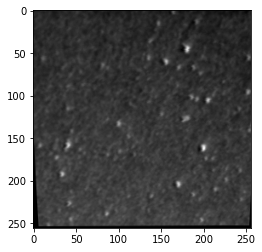

In [106]:
try:
    results_r, results_h, h, imMatches, imKeypoints = align_and_scale(intensity_1, intensity_2, m_1, m_2, m_3, m_4, match_percent=0.5, filter=0)
    intensity_1_r, intensity_2_r, m_1_r, m_2_r, m_3_r, m_4_r = results_r
    intensity_1_h, m_1_h, m_2_h = results_h

    intensity_2_scaled_to_1 = rescale_to(intensity_2_r, intensity_1_r)
    m_4_scaled_to_1 = rescale_to(m_4_r, m_1_r)
    difference_im = intensity_2_scaled_to_1 - intensity_1_r
    difference_mx = m_4_scaled_to_1 - m_1_r

    m_1_r_g_full = rescale_to(gaussian_filter(m_1_r, sigma), m_1_r)
    m_2_r_g_full = rescale_to(gaussian_filter(m_2_r, sigma), m_2_r)
    m_3_r_g_full = rescale_to(gaussian_filter(m_3_r, sigma), m_3_r)
    m_4_r_g_full = rescale_to(gaussian_filter(m_4_r, sigma), m_4_r)
except Exception as ex:
    print()
    print(ex)
    print()
    traceback.print_exc()

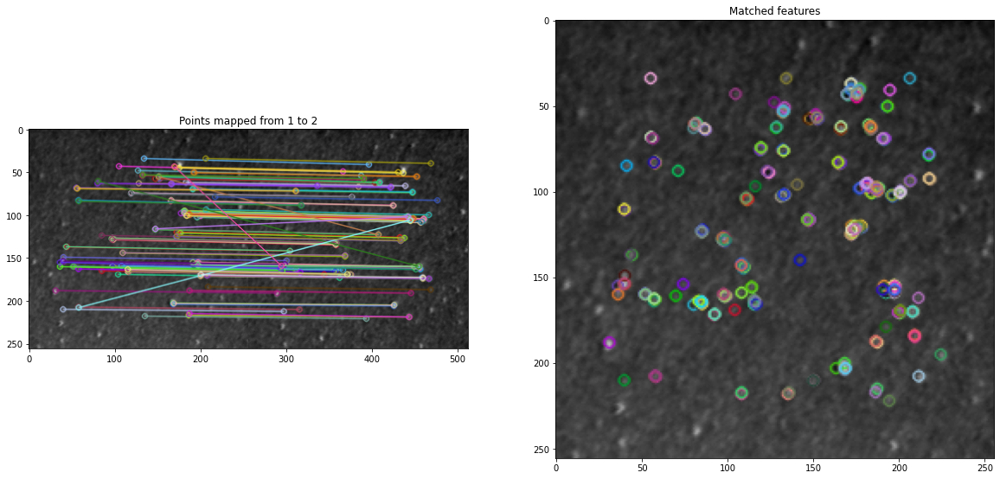

In [102]:
fig = plt.figure(figsize=(20, 10));
fig.add_subplot(121);
plt.imshow(imMatches);
plt.title('Points mapped from 1 to 2');

fig.add_subplot(122);
plt.imshow(imKeypoints);
plt.title('Matched features');

Cropped to 248 x 252
-0.005295727700038848


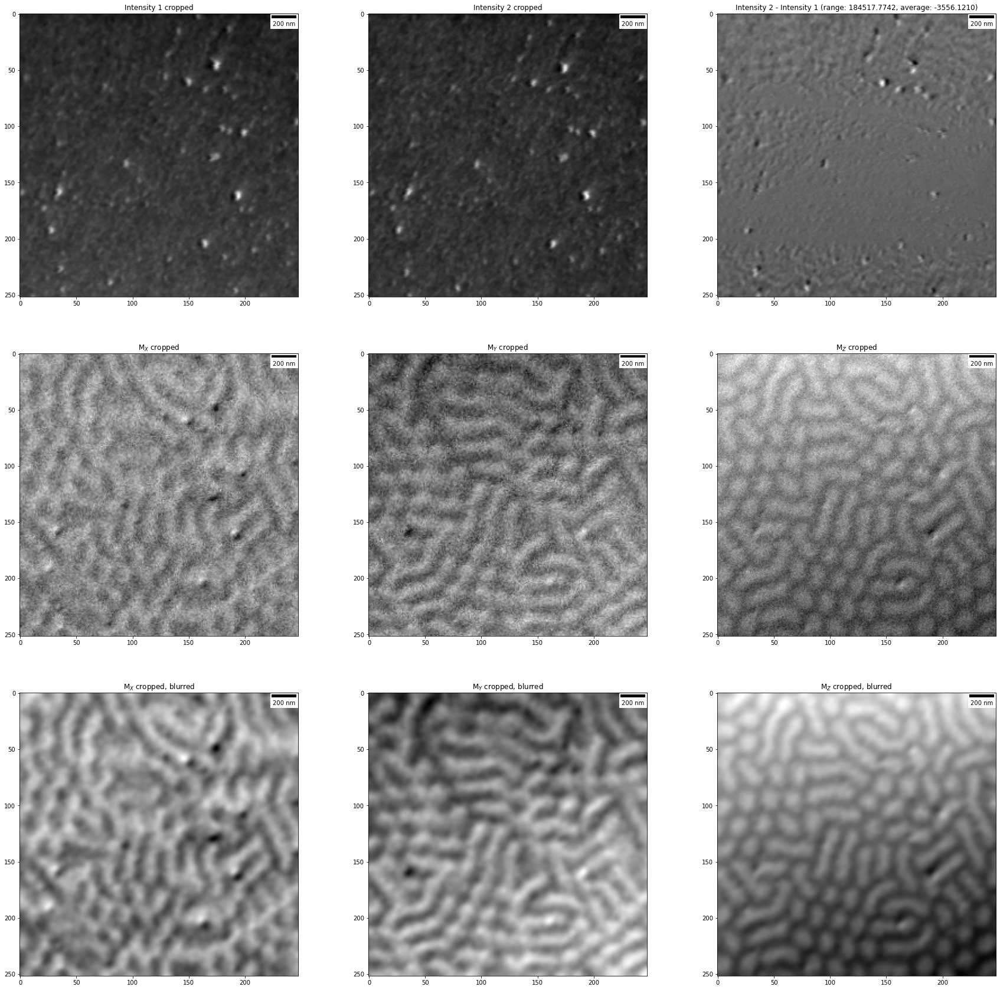

In [105]:
fig = plt.figure(figsize=(30, 30));

ax1 = fig.add_subplot(3, 3, 1);
ax1.imshow(intensity_1_r, cmap='gray');
ax1.set_title('Intensity 1 cropped')

ax2 = fig.add_subplot(3, 3, 2);
ax2.imshow(intensity_2_r, cmap='gray');
ax2.set_title('Intensity 2 cropped')

ax3 = fig.add_subplot(3, 3, 3);
ax3.imshow(difference_im, cmap='gray');
ax3.set_title(f'Intensity 2 - Intensity 1 (range: {np.ptp(difference_im):.4f}, average: {np.average(difference_im):.4f})');


ax4 = fig.add_subplot(3, 3, 4);
ax4.imshow(m_1_r, cmap='gray');
ax4.set_title(fr'M$_{axis_1}$ cropped');

ax5 = fig.add_subplot(3, 3, 5);
ax5.imshow(m_2_r, cmap='gray');
ax5.set_title(fr'M$_{axis_2}$ cropped');

ax6 = fig.add_subplot(3, 3, 6);
ax6.imshow(m_3_r, cmap='gray');
ax6.set_title(fr'M$_{axis_3}$ cropped');

ax7 = fig.add_subplot(3, 3, 7);
ax7.imshow(m_1_r_g_full, cmap='gray')
ax7.set_title(fr'M$_{axis_1}$ cropped, blurred');

ax8 = fig.add_subplot(3, 3, 8);
ax8.imshow(m_2_r_g_full, cmap='gray')
ax8.set_title(fr'M$_{axis_2}$ cropped, blurred');

ax9 = fig.add_subplot(3, 3, 9);
ax9.imshow(m_3_r_g_full, cmap='gray')
ax9.set_title(fr'M$_{axis_3}$ cropped, blurred');


for ax in fig.get_axes():
    ax.add_artist(ScaleBar(scale));
    
print(f'Cropped to {intensity_1_r.shape[1]} x {intensity_1_r.shape[0]}')
print(np.sum(difference_im) / np.sum(intensity_1))


# Find offsets

The imaging components do not use the same zero point. Since the magnetization vector should have the same magnitude over the entire sample, minimize the min to max spread across the combined images.

In [12]:
# Eliminate outliers
m_1_r_g, m_2_r_g, m_3_r_g = limit_to(m_1_r_g_full), limit_to(
    m_2_r_g_full), limit_to(m_3_r_g_full)

# Find averages for each image and shift the values
m_1_average, m_2_average, m_3_average = np.average(m_1_r_g), \
    np.average(m_2_r_g), np.average(m_3_r_g)

m_1_shifted, m_2_shifted, m_3_shifted = m_1_r_g - m_1_average, \
    m_2_r_g - m_2_average, m_3_r_g - m_3_average

# Optimize the amount of shift necessary by minimizing least squares fitting
(m_1_offset, m_2_offset, m_3_offset), status, message = \
    find_offsets(m_1_shifted, m_2_shifted, m_3_shifted)

m_1_offset_opt, m_2_offset_opt, m_3_offset_opt = \
    m_1_average + m_1_offset, m_2_average + m_2_offset, m_3_average + m_3_offset

m_1_adjusted, m_2_adjusted, m_3_adjusted = \
    m_1_r_g - m_1_offset_opt, m_2_r_g - m_2_offset_opt, m_3_r_g - m_3_offset_opt

m_1_adjusted = m_1_adjusted - fit_image(m_1_adjusted)[0]
m_2_adjusted = m_2_adjusted - fit_image(m_2_adjusted)[0]
m_3_adjusted = m_3_adjusted - fit_image(m_3_adjusted)[0]

# (m_1_offset, m_2_offset, m_3_offset), status, message = find_offsets(m_1_r, m_2_r, m_3_r)
# m_1_adjusted, m_2_adjusted, m_3_adjusted = m_1_r - m_1_offset, m_2_r - m_2_offset, m_3_r - m_3_offset

print('M{} average: {:.4f}, M{} average: {:.4f}, M{} average: {:.4f}'.format(
    axis_1, m_1_average, axis_2, m_2_average, axis_3, m_3_average))
print('M{} offset: {:.4f}, M{} offset: {:.4f}, M{} offset: {:.4f}'.format(
    axis_1, m_1_offset, axis_2, m_2_offset, axis_3, m_3_offset))

print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_1, m_1_min, m_1_max, np.ptp(m_1_adjusted), m_1_adjusted.min(), m_1_adjusted.max()))
print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_2, m_2_min, m_2_max, np.ptp(m_2_adjusted), m_2_adjusted.min(), m_2_adjusted.max()))
print('M{} original range: {:.4f} to {:.4f}; offset range: {:.3f}, {:.4f} to {:.4f}'.format(
    axis_3, m_3_min, m_3_max, np.ptp(m_3_adjusted), m_3_adjusted.min(), m_3_adjusted.max()))

MX average: 1.9846, MY average: -0.9457, MZ average: 0.5836
MX offset: -0.0000, MY offset: -0.0000, MZ offset: -0.0000
MX original range: 1.9084 to 2.0509; offset range: 0.112, -0.0478 to 0.0637
MY original range: -1.0144 to -0.8584; offset range: 0.134, -0.0695 to 0.0643
MZ original range: 0.5066 to 0.6514; offset range: 0.097, -0.0446 to 0.0521


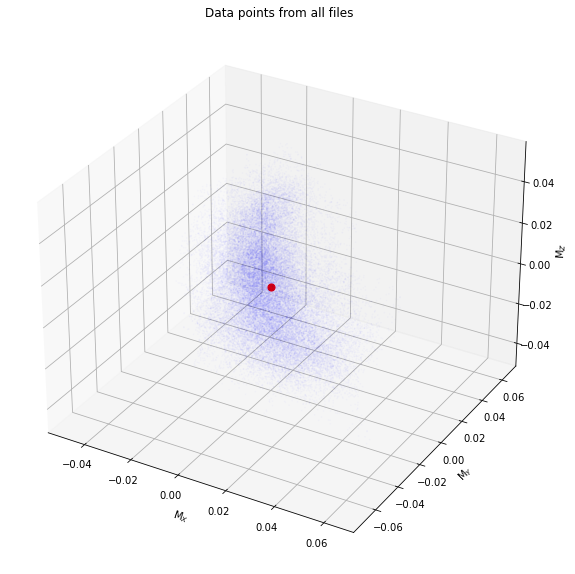

In [13]:
fig = plt.figure(figsize=(10, 10));
ax1 = fig.add_subplot(111, projection='3d');

ax1.scatter3D(m_1_adjusted.flatten(), m_2_adjusted.flatten(), m_3_adjusted.flatten(), s=1, c='blue', alpha=0.01);
ax1.scatter3D(0, 0, 0, s=50, c='red');
ax1.set_xlabel(fr'M$_{axis_1}$');
ax1.set_ylabel(fr'M$_{axis_2}$');
ax1.set_zlabel(fr'M$_{axis_3}$');
plt.title('Data points from all files');

# Calculate magnitudes and angles, find contours

In [14]:
# Calculate magnitudes and angles
magnitudes = get_magnitudes(m_1_adjusted, m_2_adjusted, m_3_adjusted)
magnitudes /= magnitudes.max()
max_dev = np.std(magnitudes)
# upper_limit = magnitudes.mean() + 3 * max_dev
# magnitudes = np.where(magnitudes < upper_limit, magnitudes, upper_limit)

phis, thetas = get_phases(m_1_adjusted, m_2_adjusted, m_3_adjusted)
phis_rgba = render_phases_and_magnitudes(phis, magnitudes)

# Apply a light gaussian filter to clean up the images
magnitudes_flattened = rescale_to(gaussian_filter(magnitudes, 2), [0, 1])
phis_flattened = rescale_to(gaussian_filter(phis, 3), phis)
thetas_flattened = rescale_to(gaussian_filter(thetas, 3), thetas)
phis_flattened_rgba = render_phases_and_magnitudes(
    phis_flattened, magnitudes_flattened)

# Find circular features in the Z direction
circular_contours, contours_g, contours = find_circular_contours(
    thetas_flattened)

mag_low, mag_high = np.percentile(
    magnitudes_flattened, 5), np.percentile(magnitudes_flattened, 95)

# Calculate 2D values as well
magnitudes_2d = get_magnitudes(m_1_adjusted, m_2_adjusted)
magnitudes_2d /= magnitudes_2d.max()
max_dev = np.std(magnitudes_2d)
upper_limit = magnitudes_2d.mean() + 3 * max_dev
magnitudes_2d_trimmed = np.where(
    magnitudes_2d < upper_limit, magnitudes_2d, upper_limit)
magnitudes_2d_flattened = rescale_to(
    gaussian_filter(magnitudes_2d_trimmed, 3), [0, 1])

phis_2d, _ = get_phases(m_1_adjusted, m_2_adjusted)

print('Magnitudes range from {:.4f} to {:.4f} with mean {:.4f}, stddev {:.4f}, and 90% confidence interval {:.4f}..{:.4f}'.format(
    magnitudes_flattened.min(), magnitudes_flattened.max(), magnitudes_flattened.mean(), max_dev, mag_low, mag_high))
print(f'\N{greek small letter phi} ranges from {phis_flattened.min():.4f} to {phis_flattened.max():.4f}')
print(f'\N{greek small letter theta} ranges from {thetas_flattened.min():.4f} to {thetas_flattened.max():.4f}')
print(
    f'Found {len(circular_contours)} circular contours, {len(contours_g)} contours not on the edge, out of {len(contours)} total.')


(21,)
Magnitudes range from 0.0000 to 1.0000 with mean 0.3117, stddev 0.1664, and 90% confidence interval 0.1330..0.5581
φ ranges from 0.0007 to 6.2829
θ ranges from 0.0084 to 3.1382
Found 1 circular contours, 13 contours not on the edge, out of 21 total.


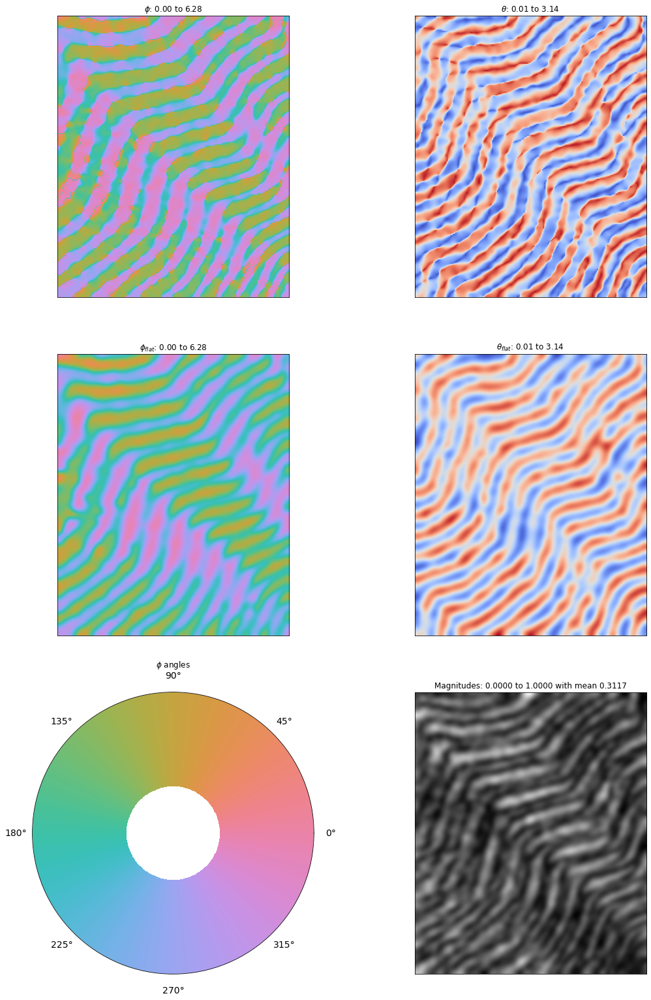

In [15]:
plt.figure(figsize=(18, 27));

ax1 = plt.subplot(3, 2, 1);
ax1.imshow(phis, cmap=ciecam02_cmap());
ax1.set_title(rf'$\phi$: {phis.min():.2f} to {phis.max():.2f}');
ax1.axes.get_xaxis().set_visible(False)
ax1.axes.get_yaxis().set_visible(False)

ax2 = plt.subplot(3, 2, 2);
ax2.imshow(thetas, cmap=cm.coolwarm_r);
ax2.set_title(rf'$\theta$: {thetas.min():.2f} to {thetas.max():.2f}');
ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)

ax3 = plt.subplot(3, 2, 3);
ax3.imshow(phis_flattened, cmap=ciecam02_cmap());
ax3.set_title(rf'$\phi_{{flat}}$: {phis_flattened.min():.2f} to {phis_flattened.max():.2f}');
ax3.axes.get_xaxis().set_visible(False)
ax3.axes.get_yaxis().set_visible(False)

ax4 = plt.subplot(3, 2, 4);
ax4.imshow(thetas_flattened, cmap=cm.coolwarm_r);
ax4.set_title(rf'$\theta_{{flat}}$: {thetas_flattened.min():.2f} to {thetas_flattened.max():.2f}');
ax4.axes.get_xaxis().set_visible(False)
ax4.axes.get_yaxis().set_visible(False)

ax5 = plt.subplot(3, 2, 5, polar=True)
show_phase_colors_circle(ax5, add_dark_background=False)
ax5.set_title(r'$\phi$ angles');

ax6 = plt.subplot(3, 2, 6);
ax6.imshow(magnitudes_flattened, cmap='gray');
ax6.set_title(f'Magnitudes: {magnitudes_flattened.min():.4f} to '
              f'{magnitudes_flattened.max():.4f} with mean {magnitudes_flattened.mean():.4f}');
ax6.axes.get_xaxis().set_visible(False)
ax6.axes.get_yaxis().set_visible(False)


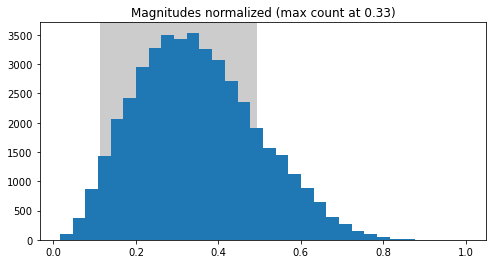

In [16]:
bins = 32

plt.figure(figsize=(8, 4));
n, b, _ = plt.hist(magnitudes.flatten(), bins=bins, zorder=10);
max_count = max(n)
avg = (1 + 2 * np.squeeze(np.where(n == max_count))[()]) / (2 * bins)
spline = UnivariateSpline(np.linspace(0, 1, bins), n - max_count / 2, s=0)
# plt.vlines(mag_low, 0, max_count, color='gray');
# plt.vlines(mag_high, 0, max_count, color='gray')
plt.axvspan(*spline.roots(), facecolor='gray', alpha=0.4, zorder=0);
plt.title(f'Magnitudes normalized (max count at {avg:.2f})');


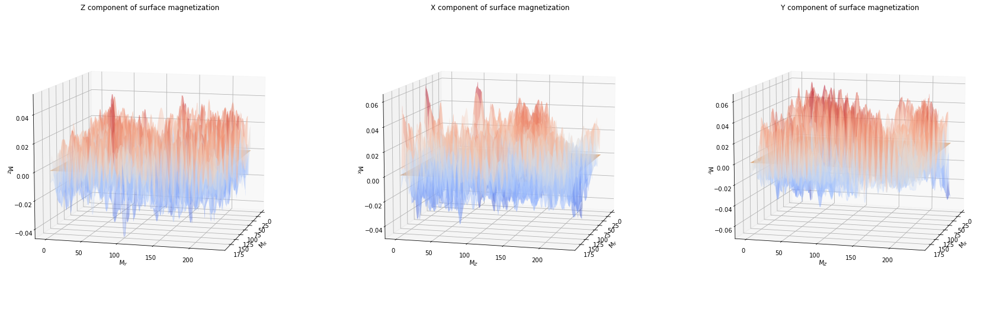

In [17]:
# %matplotlib widget

azim, elev = 15, 10;

xs, ys = np.linspace(1, magnitudes.shape[1], magnitudes.shape[1]), np.linspace(1, magnitudes.shape[0], magnitudes.shape[0])
Xs, Ys = np.meshgrid(xs, ys)

zs = m_3_adjusted # magnitudes * np.cos(thetas_flattened)

fig = plt.figure(figsize=(30, 11));
ax1 = fig.add_subplot(1, 3, 1, projection='3d');
ax1.azim = azim;
ax1.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax1.plot_surface(Xs, Ys, zs, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax1.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax1.set_xlabel(fr'M$_{axis_1}$');
ax1.set_ylabel(fr'M$_{axis_2}$');
ax1.set_zlabel(fr'M$_{axis_3}$');
plt.title(f'{axis_3} component of surface magnetization');

ax2 = fig.add_subplot(1, 3, 2, projection='3d');
ax2.azim = azim;
ax2.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax2.plot_surface(Xs, Ys, m_1_adjusted, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax2.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax2.set_xlabel(fr'M$_{axis_2}$');
ax2.set_ylabel(fr'M$_{axis_3}$');
ax2.set_zlabel(fr'M$_{axis_1}$');
plt.title(f'{axis_1} component of surface magnetization');

ax3 = fig.add_subplot(1, 3, 3, projection='3d');
ax3.azim = azim;
ax3.elev = elev;
# ax.contour3D(Xs, Ys, zs, 100, cmap=cm.coolwarm, alpha=0.5);
surface = ax3.plot_surface(Xs, Ys, m_2_adjusted, cmap=cm.coolwarm, linewidth=0, alpha=0.3);
ax3.plot_surface(Xs, Ys, np.zeros_like(Xs), alpha=0.5)
# ax.plot_wireframe(Xs, Ys, zs, cmap=cm.coolwarm);

ax3.set_xlabel(fr'M$_{axis_1}$');
ax3.set_ylabel(fr'M$_{axis_3}$');
ax3.set_zlabel(fr'M$_{axis_2}$');
plt.title(f'{axis_2} component of surface magnetization');

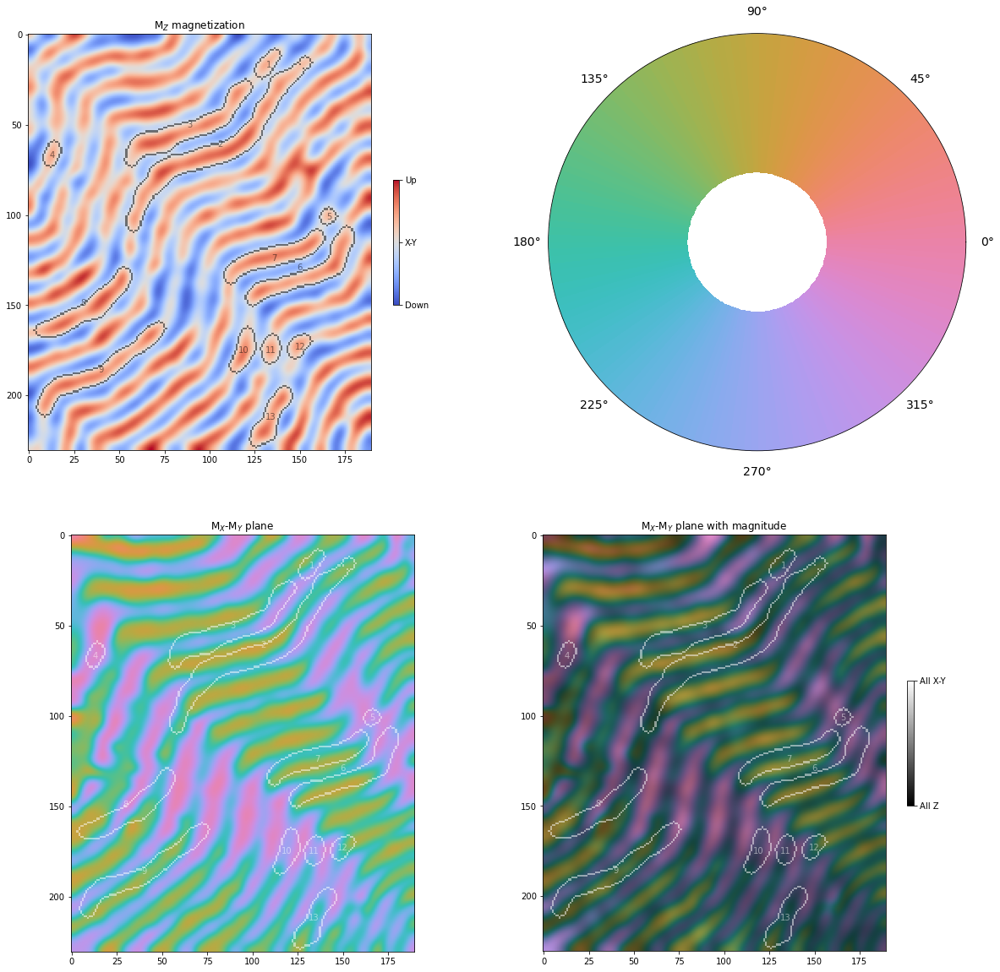

In [18]:
fig = plt.figure(figsize=(20, 20));

ax1 = fig.add_subplot(221);
ax1.imshow(thetas_flattened, cmap=cm.coolwarm_r);

show_all_circles(thetas_flattened, contours_g, ax1, alpha=0.5);

sm = cm.ScalarMappable(cmap=cm.coolwarm)
cbar = fig.colorbar(sm, ax=ax1, shrink=0.3);
cbar.set_ticks([0, 0.5, 1]);
cbar.ax.set_yticklabels(['Down', f'{axis_1}-{axis_2}', 'Up']);
#cbar.set_label('Magnetization in Z');
ax1.set_title(rf'M$_{axis_3}$ magnetization');# ax1.imshow(masked_circles, interpolation='none');

ax2 = fig.add_subplot(222, polar=True);
show_phase_colors_circle(ax2, add_dark_background=False, text_color='black');

ax3 = fig.add_subplot(223);
ax3.imshow(phis_flattened, cmap=ciecam02_cmap());
show_all_circles(thetas_flattened, contours_g, ax3, alpha=0.5, color='white');

ax3.set_title(rf'M$_{axis_1}$-M$_{axis_2}$ plane');

ax4 = fig.add_subplot(224);
phis_flattened_rgba = render_phases_and_magnitudes(phis_flattened, magnitudes_2d_flattened)
ax4.imshow(phis_flattened_rgba, cmap=ciecam02_cmap());
show_all_circles(thetas_flattened, contours_g, ax4, alpha=0.5, color='white');

sm = cm.ScalarMappable(cmap=cm.binary_r)
cbar = fig.colorbar(sm, ax=ax4, shrink=0.3);
cbar.set_ticks([0, 1]);
cbar.ax.set_yticklabels([f'All {axis_3}', f'All {axis_1}-{axis_2}']);

ax4.set_title(rf'M$_{axis_1}$-M$_{axis_2}$ plane with magnitude');


Found 13 boxes.
Of 1 circular feature(s) total, 0 have deviations ≤ pi/6 (0.52)


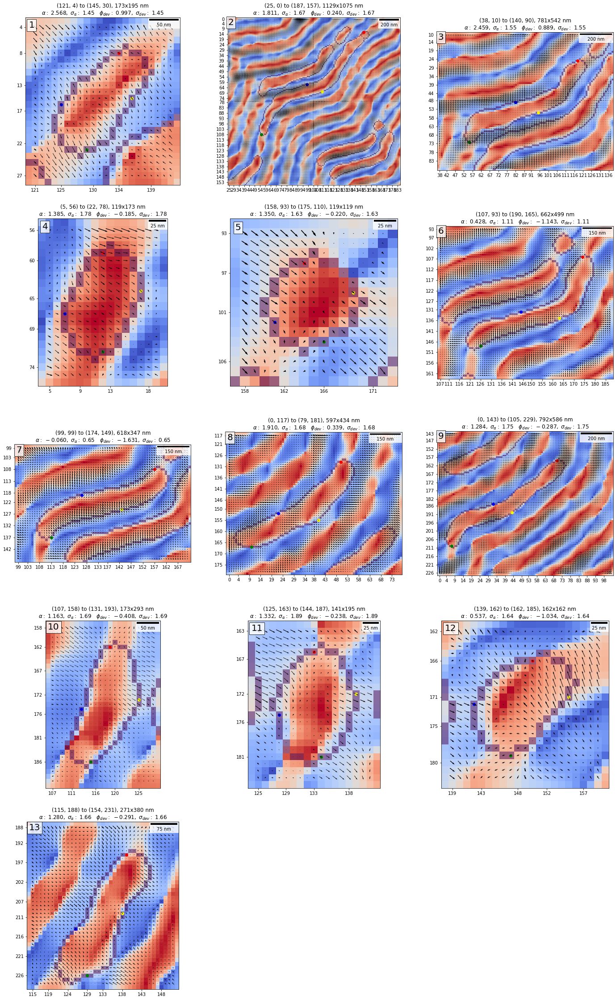

In [21]:
candidates, all_contours = show_circles(magnitudes_flattened, phis, thetas, contours_g, scale,
                                        phis_m=phis_flattened_rgba, normalize=False,
                                        show_numbers=True, show_axes=True, show_title=True,
                                        just_candidates=False)

indices = list(candidates.keys())
print(f'Of {len(circular_contours)} circular feature(s) total, {len(indices)} have deviations ≤ pi/6 ({np.pi / 6:.2f})')

if len(indices) > 0:
    print(f'Indices are {indices}')
    values = np.array(list(candidates.values()))
    best_std = np.min(values[:, 1])
    best_index = [index for index, details in candidates.items()
                  if details[1] == best_std]
    print(f'Index {best_index} is the best match')


In [35]:
show_groups(circular_contours, magnitudes, phis, thetas, scale)

<Figure size 864x0 with 0 Axes>

In [47]:
# ltem_data_name = 'img005_alpha05.npy'
# ltem_data_name = 'img006_alpha05_OL0000.npy'
# ltem_data_name = '00_B.npy'
ltem_data_name = 'n50_B.npy'
ltem_data_path = indir + 'will/' + ltem_data_name

ltem_phases, ltem_magnitudes, ltem_circular_contours, ltem_contours_g, ltem_alphas = process_ltem_data(ltem_data_path)
# Rotate phase data by 90º, staying within 0..2 pi
ltem_phases = np.where(ltem_phases >= 3/2 * np.pi, ltem_phases - 3/2 * np.pi, ltem_phases + np.pi / 2)
print(f'\N{greek small letter sigma} for ltem_alpha = {np.std(ltem_alphas[:, 2]):.3f}')


σ for ltem_alpha = 0.264


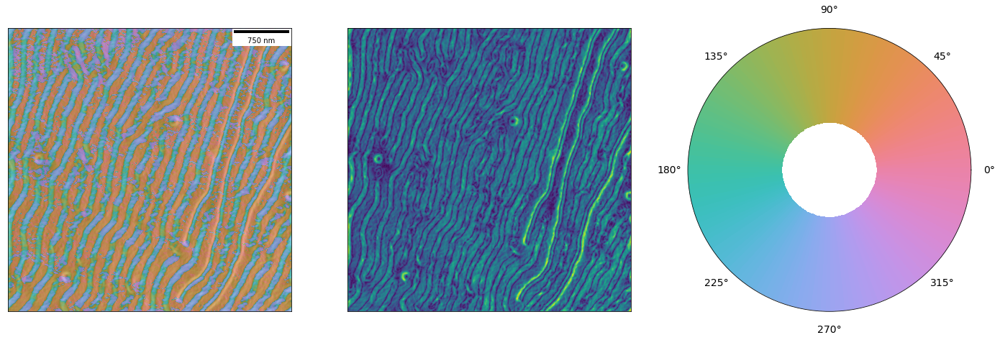

In [21]:
cutoff = 50

plt.figure(figsize=(24, 8))
ax1 = plt.subplot(131)
ax1.imshow(ltem_phases[cutoff:-cutoff, cutoff:-cutoff],
           cmap=ciecam02_cmap())
ax1.imshow(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff], cmap=cm.binary_r, alpha=0.25)
#ax1.set_title(f'Phases for {ltem_data_name}');
ax1.set_xticks([])
ax1.set_yticks([])
ax1.add_artist(ScaleBar(1.987e-9))
ax2 = plt.subplot(132)
#ax2.imshow(ltem_circular_contours)
ax2.imshow(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff])
#show_all_circles(ltem_magnitudes[cutoff:-cutoff, cutoff:-cutoff],
#                 ltem_circular_contours, ax2, alpha=0.5, show_numbers=False)
#ax2.set_title(f'Magnitudes for {ltem_data_name}');
ax2.set_xticks([])
ax2.set_yticks([])
ax3 = plt.subplot(133, polar=True)
show_phase_colors_circle(add_dark_background=False, ax=ax3)


/opt/homebrew/Caskroom/miniforge/base/envs/pynv/lib/python3.9/site-packages/numpy/core/_asarray.py:102: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order)


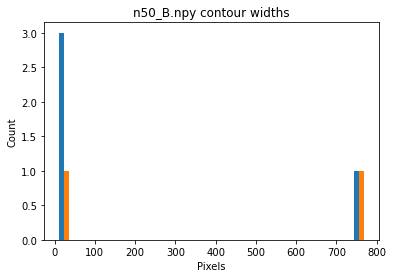

In [22]:
ltem_boxes = get_bounding_boxes(ltem_contours_g)
ltem_box_widths = np.asarray(ltem_boxes)[:, 2]

plt.hist(ltem_box_widths, bins=25);
plt.xlabel('Pixels');
plt.ylabel('Count');
plt.title(f'{ltem_data_name} contour widths');

0.8202975089226998 1.0634576515342942 0.8202975089226998
[2.61699488 2.67995489 2.45562574 2.76956434 2.98323427 2.54458861
 2.46198233 2.76556895 2.68824985 2.55891309 2.63921656 2.67816019
 2.67300945 2.48911266 2.76795415 2.46091454 2.60034185 2.69999256
 2.79939358 2.50080202 2.6352813  2.40021606 2.61314431 2.79123211
 2.52878002 2.67918557 2.56537074 2.74848462 2.555583  ]


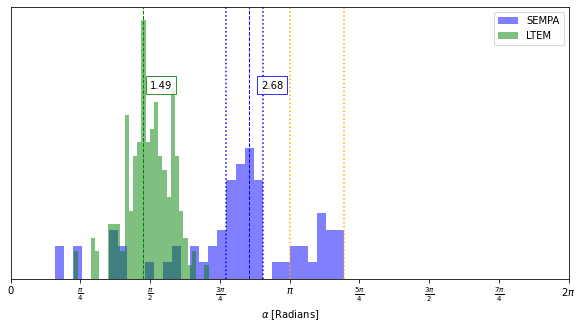

In [24]:
p, all_alphas, circle_alphas = show_alphas(contours_g, circular_contours, phis, f'{name} {str(runs)} and {ltem_data_name}', show_circles_separately=False, bins=32, ltem_data=ltem_alphas[:, 2], show_title=False)

low_indices = np.where(np.logical_and(
    all_alphas[:, 2] < 0.95 * np.pi, all_alphas[:, 2] > 0.75 * np.pi))
high_indices = np.where(all_alphas[:, 2] > 0.9 * np.pi)

low_hump = all_alphas[low_indices][:, 3]
high_hump = all_alphas[high_indices][:, 3]

sigma_low = np.mean(low_hump)
sigma_high = np.mean(high_hump)

p.axvline(2.68 - 0.26, color='blue', linestyle='dotted');
p.axvline(2.68 + 0.16, color='blue', linestyle='dotted')
p.axvline(3.5 - 0.35, color='orange', linestyle='dotted')
p.axvline(3.5 + 0.25, color='orange', linestyle='dotted')

print(sigma_low, sigma_high, np.mean(low_hump))
print(all_alphas[low_indices][:, 2])


In [29]:
all_alphas[:, 2].max()

3.7531790053160536

# Save results

In [ ]:
save_file(file, intensity_flat, img, axis_1, axis_2, scale, img_denoised_1=m_1_denoised,
          img_denoised_2=m_2_denoised, arrow_color=arrow_color, arrow_scale=arrow_scale)